# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Exercise-2.1.-Minimizing-a-quadratic-function-and-the-curse-of-dimensionality" data-toc-modified-id="Exercise-2.1.-Minimizing-a-quadratic-function-and-the-curse-of-dimensionality-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Exercise 2.1. Minimizing a quadratic function and the curse of dimensionality</a></div><div class="lev1 toc-item"><a href="#Exercise-2.2.-Implementing-random-search-in-Python" data-toc-modified-id="Exercise-2.2.-Implementing-random-search-in-Python-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Exercise 2.2. Implementing random search in Python</a></div><div class="lev1 toc-item"><a href="#Exercise-2.3.-Using-random-search-to-minimize-a-nonconvex-function" data-toc-modified-id="Exercise-2.3.-Using-random-search-to-minimize-a-nonconvex-function-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Exercise 2.3. Using random search to minimize a nonconvex function</a></div><div class="lev1 toc-item"><a href="#Exercise-2.4.-Random-search-with-diminishing-steplength" data-toc-modified-id="Exercise-2.4.-Random-search-with-diminishing-steplength-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Exercise 2.4. Random search with diminishing steplength</a></div><div class="lev1 toc-item"><a href="#Exercise-2.8.-Coordinate-search-applied-to-minimize-a-simple-quadratic" data-toc-modified-id="Exercise-2.8.-Coordinate-search-applied-to-minimize-a-simple-quadratic-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Exercise 2.8. Coordinate search applied to minimize a simple quadratic</a></div><div class="lev1 toc-item"><a href="#Exercise-2.9.-Coordinate-search-with-diminishing-steplength" data-toc-modified-id="Exercise-2.9.-Coordinate-search-with-diminishing-steplength-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Exercise 2.9. Coordinate search with diminishing steplength</a></div><div class="lev1 toc-item"><a href="#Exercise-2.10.-Coordinate-search-versus-coordinate-descent" data-toc-modified-id="Exercise-2.10.-Coordinate-search-versus-coordinate-descent-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Exercise 2.10. Coordinate search versus coordinate descent</a></div>

In [233]:
# imports from custom library
import sys
sys.path.append('../')
import math
import random
import itertools

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d
from matplotlib import gridspec

import numpy as np

%matplotlib inline

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Exercise 2.1. Minimizing a quadratic function and the curse of dimensionality

Consider the simple quadratic function

$$
g(\mathbf{w}) = \mathbf{w}^T\mathbf{w}
$$

whose minimum is always $g(\mathbf{0}_{N\times 1}) = 0$ regardless of the input dimension $N$.

(a) Create a range of these quadratics for input dimension $N=1$ to $N = 100$, sample the input space of each $P = 100$ times uniformly on the hypercube $[-1,1]\times [-1,1] \times \cdots \times [-1,1]$ (this hypercube has $N$ sides), and plot the *minimum*
value attained for each quadratic against the input dimension $N$.

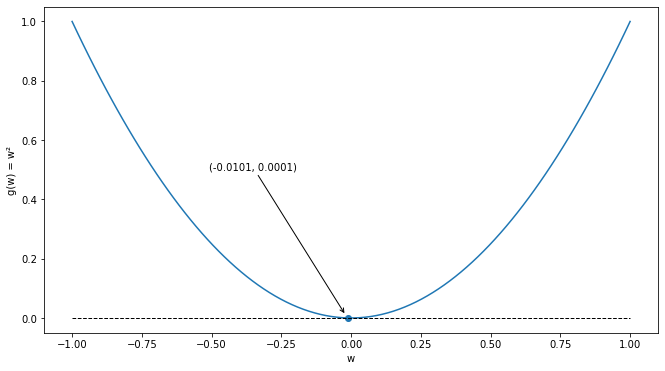

In [298]:
# Simple solution for N = 1 => g(w) = w²
N = 1
P = 100
start = -1
stop = 1

w = np.linspace(start, stop, P)
g = w ** 2
min_g = np.min(g)
min_g_index = np.argmin(g)
min_w = w[min_g_index]


plt.figure(figsize=(11,6))
plt.plot(w, g)
plt.scatter(min_w, min_g)
plt.xlabel('w')
plt.ylabel('g(w) = w²')
plt.annotate("({}, {})".format(round(min_w, 4), round(min_g, 4)), xytext=(min_w - 0.5, min_g + 0.5), xy=(min_w - 0.01, min_g + 0.01), arrowprops=dict(arrowstyle="->"))
plt.plot(w,w*0,linewidth=1,linestyle='--',color = 'k')
plt.show()

minimum as (-0.1111, -0.1111, 0.0247)


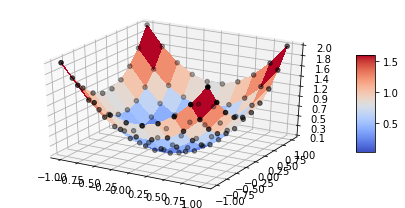

In [6]:
# Simple solution for N = 2 => g(w₁, w₂) = w₁² + w₂²
N = 2
P = 100
start, stop = (-1, 1)
points_per_dimension = math.floor(P ** (1 / N))
points = np.linspace(start, stop, points_per_dimension)
W = np.array([w for w in itertools.product(points, repeat=N)])
g = np.sum(W ** 2, axis=1)
min_g = np.min(g)
min_g_index = np.argmin(g)
min_W = W[min_g_index]

print("minimum as ({}, {}, {})".format(round(min_W[0], 4), round(min_W[1], 4), round(min_g, 4)))

fig = plt.figure(figsize=(6, 3))
ax = fig.gca(projection='3d')


X = np.linspace(start, stop, int(P / 10))
Y = np.linspace(start, stop, int(P / 10))
X, Y = np.meshgrid(X, Y)
Z = X**2 + Y**2
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(0.10, 2)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.1f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

ax.scatter(W[:, 0], W[:, 1], g, c="black")

plt.tight_layout()

In [16]:
# Using uniform distribution we can not compute N >> 10
P = 10000
start, stop = (-1, 1)
fromN, toN = (1, 10)
N = np.arange(fromN, toN + 1)
for n in N:
    points_per_dimension = math.floor(P ** (1 / n))
    points = np.linspace(start, stop, points_per_dimension)
    W = np.array([w for w in itertools.product(points, repeat=n)])
    g = np.sum(W ** 2, axis=1)
    min_g = np.min(g)
    min_g_index = np.argmin(g)
    min_W = W[min_g_index]
    print(min_W, min_g)

[-0.00010001] 1.0002000300023423e-08
[-0.01010101 -0.01010101] 0.00020406081012141434
[0. 0. 0.] 0.0
[-0.11111111 -0.11111111 -0.11111111 -0.11111111] 0.04938271604938276
[-0.2 -0.2 -0.2 -0.2 -0.2] 0.1999999999999999
[-0.33333333  0.33333333  0.33333333  0.33333333  0.33333333  0.33333333] 0.6666666666666664
[0. 0. 0. 0. 0. 0. 0.] 0.0
[0. 0. 0. 0. 0. 0. 0. 0.] 0.0
[-1. -1. -1. -1. -1. -1. -1. -1. -1.] 9.0
[-1. -1. -1. -1. -1. -1. -1. -1. -1. -1.] 10.0


Repeat parts (a) and (b), this time replacing uniformly chosen samples with
randomly selected ones.

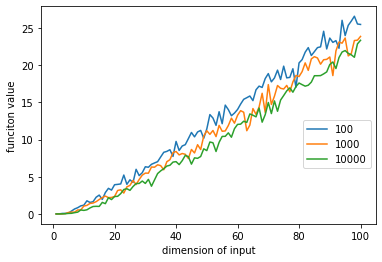

In [93]:
P = [100, 1000, 10000]
start, stop = (-1, 1)
fromN, toN = (1, 100)
N = np.arange(fromN, toN + 1)
results = np.empty((len(N), len(P)))
for p_index, p in enumerate(P):
    for n in N:
        W = np.random.rand(p, n) * np.random.choice([-1, 1], size=(p, n))
        g = np.sum(W ** 2, axis=1)
        min_g = np.min(g)
        results[n - fromN, p_index] = min_g

for p_index in range(len(P)):
    Y = results[:, p_index]
    X = N
    plt.plot(X, Y)

plt.xlabel("dimension of input")
plt.ylabel("funciton value")

# draw legend
t = [str(p) for p in P]
plt.legend(t, bbox_to_anchor=(1, 0.5))

 A few simple hand-calculations can precisely affirm why this is happening for the particular set of very simple functions we are studying here.  To produce a random point in the input space of the function we sample each axis of the input hypercube  according to a uniform distribution on the interval $[-1,1]$.  Thus the *average value along each input dimension* is equal to 0 (as the average of a uniform on the interval $[a,b]$ is given as $\frac{1}{2}(a+b)$).

The problem is that the probability that all input elements are small in magnitude (close to zero or equal to zero) *simultaneously* gets exponentially smaller as we go up in dimension.  In one dimension, the probability of selecting a value on the interval $[-0.1,0.1]$ is - by definition - $p(v \leq |0.1|) = \frac{0.2}{2} = 0.1$.  However as we go up in dimension since each dimension is drawn independently this means that in $N$ dimensions the probability of drawing each element $v_i$ so that $v_i \leq | 0.1 | $ is $p(v_i \leq |0.1|,\,\, i = 1,...,N) = (0.1)^N$. 

Thus as our dimension increases the probability of randomly accessing points close to the true global minimum at the origin diminishes exponentially.  This again implies that in order to keep up with this our sampling would have to increase exponentially with dimension as well - which is computationally infeasible.

# Exercise 2.2. Implementing random search in Python

Implement the random search algorithm in Python and repeat the experiment discussed in Example 2.4.

Below we have a ``Python`` implementation of the random local search algorithm.  

In [242]:
# random search function
def random_search(g,alpha_choice,max_its,w,num_samples):
    # run random search
    weight_history = []         # container for weight history
    cost_history = []           # container for corresponding cost function history
    alpha = 0
    for k in range(1,max_its+1):        
        # check if diminishing steplength rule used
        if alpha_choice == 'diminishing':
            alpha = 1/float(k)
        else:
            alpha = alpha_choice
            
        # record weights and cost evaluation
        weight_history.append(w)
        cost_history.append(g(w))
        
        # construct set of random unit directions
        directions = np.random.randn(num_samples,np.size(w))
        norms = np.sqrt(np.sum(directions*directions,axis = 1))[:,np.newaxis]
        directions = directions/norms   
        
        ### pick best descent direction
        # compute all new candidate points
        w_candidates = w + alpha*directions
        
        # evaluate all candidates
        evals = np.array([g(w_val) for w_val in w_candidates])

        # if we find a real descent direction take the step in its direction
        ind = np.argmin(evals)
        if g(w_candidates[ind]) < g(w):
            # pluck out best descent direction
            d = directions[ind,:]
        
            # take step
            w = w + alpha*d
        
    # record weights and cost evaluation
    weight_history.append(w)
    cost_history.append(g(w))
    return weight_history,cost_history

Notice that the history of function evaluations returned is called ``cost_history``.  This is because - in the context of machine learning / deep learning - mathematical functions are often referred to as *cost* or *loss* functions.

In [290]:

### makes color spectrum for plotted run points - from green (start) to red (stop)
def make_colorspec(w_hist):
    # make color range for path
    s = np.linspace(0,1,len(w_hist[:round(len(w_hist)/2)]))
    s.shape = (len(s),1)
    t = np.ones(len(w_hist[round(len(w_hist)/2):]))
    t.shape = (len(t),1)
    s = np.vstack((s,t))
    colorspec = []
    colorspec = np.concatenate((s,np.flipud(s)),1)
    colorspec = np.concatenate((colorspec,np.zeros((len(s),1))),1)
    return colorspec

### plot points and connectors in input space in 3d plot        
def show_inputspace_path(w_hist,ax):
    # make colors for plot
    colorspec = make_colorspec(w_hist)
    
    for k in range(len(w_hist)):
        c = colorspec[k]
        pt1 = w_hist[k]
        ax.scatter(pt1[0],pt1[1],0,color=colorspec[k],s = 60,edgecolor = 'k',linewidth = 0.5*math.sqrt((1/(float(k) + 1))),zorder = 3)
        if k < len(w_hist)-1:
            pt2 = w_hist[k+1]
            if np.linalg.norm(pt1 - pt2) > 10**(-3):
                # draw arrow in left plot
                a = Arrow3D([pt1[0],pt2[0]], [pt1[1],pt2[1]], [0, 0], mutation_scale=10, lw=2, arrowstyle="-|>", color="k")
                ax.add_artist(a)

### function for drawing weight history path
def draw_weight_path(ax,w_hist,**kwargs):
    # make colors for plot
    colorspec = make_colorspec(w_hist)
    
    arrows = True
    if 'arrows' in kwargs:
        arrows = kwargs['arrows']

    ### plot function decrease plot in right panel
    for j in range(len(w_hist)):  
        w_val = w_hist[j]

        # plot each weight set as a point
        ax.scatter(w_val[0],w_val[1],s = 80,color = colorspec[j],edgecolor="k",linewidth = 2*math.sqrt((1/(float(j) + 1))),zorder = 3)

        # plot connector between points for visualization purposes
        if j > 0:
            pt1 = w_hist[j-1]
            pt2 = w_hist[j]
            
            # produce scalar for arrow head length
            pt_length = np.linalg.norm(pt1 - pt2)
            head_length = 0.1
            alpha = (head_length - 0.35)/pt_length + 1
            
            # if points are different draw error
            if np.linalg.norm(pt1 - pt2) > head_length and arrows == True:
                if np.ndim(pt1) > 1:
                    pt1 = pt1.flatten()
                    pt2 = pt2.flatten()
                    
                    
                # draw color connectors for visualization
                w_old = pt1
                w_new = pt2
                ax.plot([w_old[0],w_new[0]],[w_old[1],w_new[1]],color = colorspec[j],linewidth = 2,alpha = 1,zorder = 2)      # plot approx
                ax.plot([w_old[0],w_new[0]],[w_old[1],w_new[1]],color = 'k',linewidth = 3,alpha = 1,zorder = 1)      # plot approx
            
            
                # draw arrows connecting pairwise points
                #ax.arrow(pt1[0],pt1[1],(pt2[0] - pt1[0])*alpha,(pt2[1] - pt1[1])*alpha, head_width=0.1, head_length=head_length, fc='k', ec='k',linewidth=4,zorder = 2,length_includes_head=True)
                #ax.arrow(pt1[0],pt1[1],(pt2[0] - pt1[0])*alpha,(pt2[1] - pt1[1])*alpha, head_width=0.1, head_length=head_length, fc='w', ec='w',linewidth=0.25,zorder = 2,length_includes_head=True)

### draw surface plot
def draw_surface(g,ax,**kwargs):
    xmin = -3.1
    xmax = 3.1
    ymin = -3.1
    ymax = 3.1
    if 'xmin' in kwargs:            
        xmin = kwargs['xmin']
    if 'xmax' in kwargs:
        xmax = kwargs['xmax']
    if 'ymin' in kwargs:            
        ymin = kwargs['ymin']
    if 'ymax' in kwargs:
        ymax = kwargs['ymax']   
        
    #### define input space for function and evaluate ####
    w1 = np.linspace(xmin,xmax,200)
    w2 = np.linspace(ymin,ymax,200)
    w1_vals, w2_vals = np.meshgrid(w1,w2)
    w1_vals.shape = (len(w1)**2,1)
    w2_vals.shape = (len(w2)**2,1)
    h = np.concatenate((w1_vals,w2_vals),axis=1)
    func_vals = np.asarray([g(np.reshape(s,(2,1))) for s in h])

    ### plot function as surface ### 
    w1_vals.shape = (len(w1),len(w2))
    w2_vals.shape = (len(w1),len(w2))
    func_vals.shape = (len(w1),len(w2))
    ax.plot_surface(w1_vals, w2_vals, func_vals, alpha = 0.1,color = 'w',rstride=25, cstride=25,linewidth=1,edgecolor = 'k',zorder = 2)

    # plot z=0 plane 
    ax.plot_surface(w1_vals, w2_vals, func_vals*0, alpha = 0.1,color = 'w',zorder = 1,rstride=25, cstride=25,linewidth=0.3,edgecolor = 'k') 
            
    # clean up axis
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    ax.xaxis.pane.set_edgecolor('white')
    ax.yaxis.pane.set_edgecolor('white')
    ax.zaxis.pane.set_edgecolor('white')

    ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    
    ax.set_xlabel('$w_0$',fontsize = 14)
    ax.set_ylabel('$w_1$',fontsize = 14,rotation = 0)
    ax.set_title('$g(w_0,w_1)$',fontsize = 14)

# show contour plot of input function
def draw_contour_plot(g,ax,**kwargs):
    xmin = -3.1
    xmax = 3.1
    ymin = -3.1
    ymax = 3.1
    if 'xmin' in kwargs:            
        xmin = kwargs['xmin']
    if 'xmax' in kwargs:
        xmax = kwargs['xmax']
    if 'ymin' in kwargs:            
        ymin = kwargs['ymin']
    if 'ymax' in kwargs:
        ymax = kwargs['ymax']      
    num_contours = 20
    if 'num_contours' in kwargs:
        num_contours = kwargs['num_contours']   
        
    #### define input space for function and evaluate ####
    w1 = np.linspace(xmin,xmax,400)
    w2 = np.linspace(ymin,ymax,400)
    w1_vals, w2_vals = np.meshgrid(w1,w2)
    w1_vals.shape = (len(w1)**2,1)
    w2_vals.shape = (len(w2)**2,1)
    h = np.concatenate((w1_vals,w2_vals),axis=1)
    func_vals = np.asarray([ g(np.reshape(s,(2,1))) for s in h])

    w1_vals.shape = (len(w1),len(w1))
    w2_vals.shape = (len(w2),len(w2))
    func_vals.shape = (len(w1),len(w2)) 
    
    ### make contour right plot - as well as horizontal and vertical axes ###
    # set level ridges
    levelmin = min(func_vals.flatten())
    levelmax = max(func_vals.flatten())
    cutoff = 1
    cutoff = (levelmax - levelmin)*cutoff
    numper = 4
    levels1 = np.linspace(cutoff,levelmax,numper)
    num_contours -= numper

    # produce generic contours
    levels2 = np.linspace(levelmin,cutoff,min(num_contours,numper))
    levels = np.unique(np.append(levels1,levels2))
    num_contours -= numper
    while num_contours > 0:
        cutoff = levels[1]
        levels2 = np.linspace(levelmin,cutoff,min(num_contours,numper))
        levels = np.unique(np.append(levels2,levels))
        num_contours -= numper

    # plot the contours
    ax.contour(w1_vals, w2_vals, func_vals,levels = levels[1:],colors = 'k')
    ax.contourf(w1_vals, w2_vals, func_vals,levels = levels,cmap = 'Blues')

    ###### clean up plot ######
    ax.set_xlabel('$w_0$',fontsize = 12)
    ax.set_ylabel('$w_1$',fontsize = 12,rotation = 0)
    ax.axhline(y=0, color='k',zorder = 0,linewidth = 0.5)
    ax.axvline(x=0, color='k',zorder = 0,linewidth = 0.5)
    ### cleanup panel ###
    ax.set_xlabel('$w_0$',fontsize = 14)
    ax.set_ylabel('$w_1$',fontsize = 14,labelpad = 15,rotation = 0)
    ax.axhline(y=0, color='k',zorder = 0,linewidth = 0.5)
    ax.axvline(x=0, color='k',zorder = 0,linewidth = 0.5)
    # ax.set_xticks(np.arange(round(xmin),round(xmax)+1))
    # ax.set_yticks(np.arange(round(ymin),round(ymax)+1))
    
    # set viewing limits
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(ymin,ymax)

##### draw picture of function and run for two-input function ####       
def two_input_surface_contour_plot(g,w_hist,**kwargs):
    ### input arguments ###        
    num_contours = 10
    if 'num_contours' in kwargs:
        num_contours = kwargs['num_contours']
        
    view = [20,20]
    if 'view' in kwargs:
        view = kwargs['view']

    show_surface = True
    if 'show_surface' in kwargs:
        show_surface = kwargs['show_surface']

        
    ##### construct figure with panels #####
    # construct figure
    fig = plt.figure(figsize = (11,5))
    edgecolor = 'k'

    # create subplot with 3 panels, plot input function in center plot
    # this seems to be the best option for whitespace management when using
    # both a surface and contour plot in the same figure
    if show_surface:
        gs = gridspec.GridSpec(1, 2, width_ratios=[3,1]) 
        ax1 = plt.subplot(gs[0],projection='3d'); 
        ax2 = plt.subplot(gs[1],aspect='equal'); 
    else:
        ax2 = plt.subplot(aspect='equal'); 

    # remove whitespace from figure
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1) # remove whitespace
    fig.subplots_adjust(wspace=0.01,hspace=0.01)
    
    # plot 3d surface and path in left panel
    if show_surface:
        draw_surface(g,ax1,**kwargs)
        show_inputspace_path(w_hist,ax1)
        ax1.view_init(view[0],view[1])
    
    ### make contour right plot - as well as horizontal and vertical axes ###
    draw_contour_plot(g,ax2,**kwargs)  # draw contour plot
    draw_weight_path(ax2,w_hist)              # draw path on contour plot


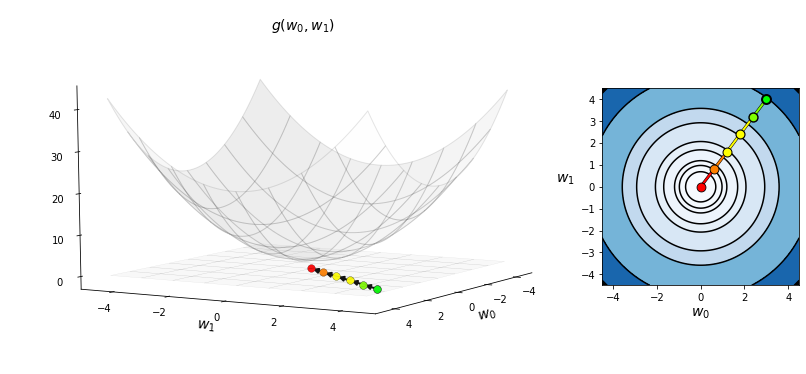

In [295]:
# define function
g = lambda w: np.dot(w.T,w) + 2

# run random search algorithm 
alpha_choice = 1; w = np.array([3,4]); num_samples = 1000; max_its = 5;
weight_history,cost_history = random_search(g,alpha_choice,max_its,w,num_samples)

two_input_surface_contour_plot(g,weight_history,view = [10,30],xmin = -4.5, xmax = 4.5, ymin = -4.5, ymax = 4.5,num_contours = 20)

# Exercise 2.3. Using random search to minimize a nonconvex function

As another example, we minimize the function

\begin{equation}
g(w_0,w_1) = \text{tanh}(4w_0 + 4w_1) + \text{max}(0.4w_0^2,1) + 1
\end{equation}

using random local search again setting $P = 1000$ and 8 steps with $\alpha = 1$ for all steps.  Here because an entire region of global minima exist at $g(w_1,w_2) = 1$ the method - as clumsy as it is given the settings - quickly finds a global minimum when initiated at $\mathbf{w}^0 = \begin{bmatrix} 2 \\ 2 \end{bmatrix}$.

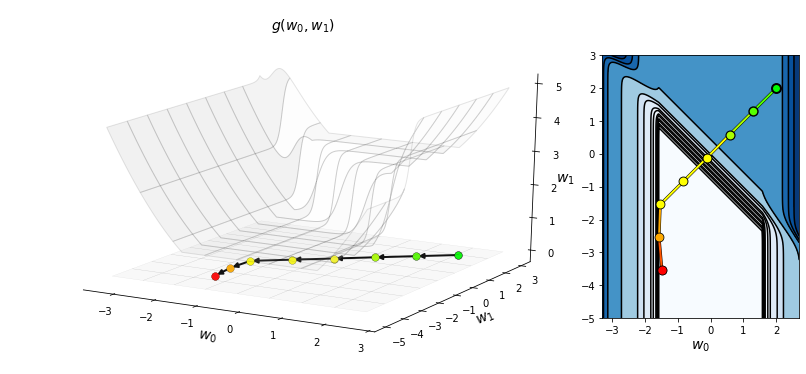

In [249]:
# define function
g = lambda w: np.tanh(4*w[0] + 4*w[1]) + max(0.4*w[0]**2,1) + 1

# run random search algorithm 
alpha_choice = 1; w = np.array([2,2]); num_samples = 1000; max_its = 8;
weight_history,cost_history = random_search(g,alpha_choice,max_its,w,num_samples)

two_input_surface_contour_plot(g,weight_history,view = [20,300],num_contours =30, xmin = -3.3,xmax = 2.7,ymin = -5,ymax = 3)

# Exercise 2.4. Random search with diminishing steplength

In the cell below we make two runs of random search using a famous optimization test function called the *Rosenbrock function* which takes the form

\begin{equation}
g\left(w_0,w_1\right) = 100\left(w_1 - w_0^2\right)^2 + \left(w_0 - 1\right)^2.
\end{equation}

This function (whose contour plot is shown in the left panel below) has a global minimum at the point $\mathbf{w}^{\star} = \begin{bmatrix} 1 \\ 1 \end{bmatrix}$ located in a very narrow and curved valley.

With both runs we begin at the point $\mathbf{w} = \begin{bmatrix} -2 \\ -2 \end{bmatrix}$, examine 1000 sample directions per step, and take a maximum of 50 steps.  First - as illustrated below - we use a fixed steplength value $\alpha = 1$.  We can see that the procedure halts after just 5 steps because every direction stemming from the final point of length one is an ascent direction.  The method was able to enter the long curved narrow valley where the mininum is located, but cannot properly navigate inside it because the steplength value is too large.

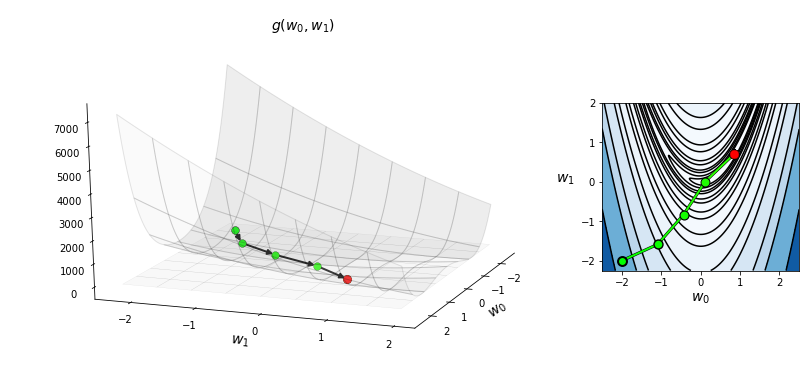

In [259]:
# define function
g = lambda w: 100*(w[1] - w[0]**2)**2 + (w[0] - 1)**2 

# run random search algorithm 
alpha_choice = 1; w = np.array([-2,-2]); num_samples = 1000; max_its = 50
weight_history_1,cost_history_1 = random_search(g,alpha_choice,max_its,w,num_samples)

# show run in both three-dimensions and just the input space via the contour plot
two_input_surface_contour_plot(g,weight_history_1,num_contours = 35,xmin = -2.5,xmax = 2.5,ymin = -2.25,ymax = 2)

Now we make the same run but use the diminishing steplength rule $\alpha = \frac{1}{k}$.  Because the steplength is constantly shortened the procedure never encounters a problem like the run above, and completes all 50 iterations.  More importantly the diminishing steplength allows this local method to better navigate the long narrow valley that contains the global mininum - and so can get substantially closer to it than can a run with a fixed steplength value.  Below make this run, plotting the original fixed steplength run in the left panel and the run produced with the diminishing steplength rule in the right panel.

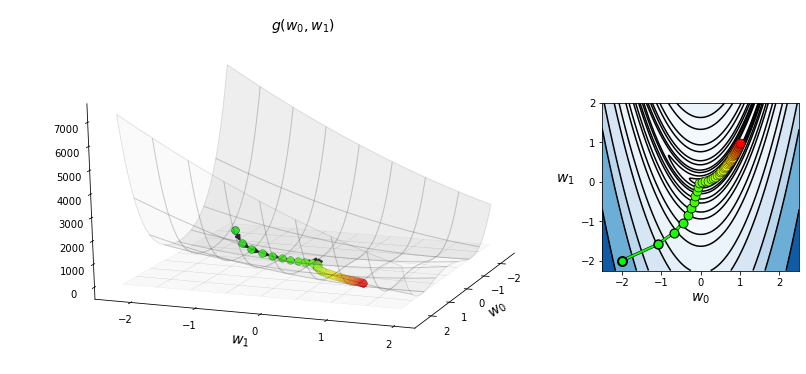

In [258]:
# define function
g = lambda w: 100*(w[1] - w[0]**2)**2 + (w[0] - 1)**2 

# run random search algorithm 
alpha_choice = 'diminishing'; w = np.array([-2,-2]); num_samples = 1000; max_its = 50
weight_history_2,cost_history_2 = random_search(g,alpha_choice,max_its,w,num_samples)
two_input_surface_contour_plot(g,weight_history_2,num_contours = 35,xmin = -2.5,xmax = 2.5,ymin = -2.25,ymax = 2)


# Exercise 2.8. Coordinate search applied to minimize a simple quadratic

Below we implement the coordinate search algorithm.

In [266]:
# zero order coordinate search
def coordinate_search(g,alpha_choice,max_its,w):
    # construct set of all coordinate directions
    directions_plus = np.eye(np.size(w),np.size(w))
    directions_minus = - np.eye(np.size(w),np.size(w))
    directions = np.concatenate((directions_plus,directions_minus),axis=0)
        
    # run coordinate search
    weight_history = []         # container for weight history
    cost_history = []           # container for corresponding cost function history
    alpha = 0
    for k in range(1,max_its+1):        
        # check if diminishing steplength rule used
        if alpha_choice == 'diminishing':
            alpha = 1/float(k)
        else:
            alpha = alpha_choice
            
        # record weights and cost evaluation
        weight_history.append(w)
        cost_history.append(g(w))
        
        ### pick best descent direction
        # compute all new candidate points
        w_candidates = w + alpha*directions
        
        # evaluate all candidates
        evals = np.array([g(w_val) for w_val in w_candidates])

        # if we find a real descent direction take the step in its direction
        ind = np.argmin(evals)
        if g(w_candidates[ind]) < g(w):
            # pluck out best descent direction
            d = directions[ind,:]
        
            # take step
            w = w + alpha*d
        
    # record weights and cost evaluation
    weight_history.append(w)
    cost_history.append(g(w))
    return weight_history,cost_history

In the next Python cell we compare 5 steps of the random search algorithm (with $P = 1000$ random directions tested at each step) to 7 steps of coordinate search, using the same starting point $\mathbf{w}^0 = \begin{bmatrix}3 \\ 4\end{bmatrix}$ and fixed steplength parameter value $\alpha = 1$ for both.  The test function in this case is the simple quadratic used in several of the examples of the previous Section

\begin{equation}
g(w_0,w_1) = w_0^2 + w_1^2 + 2.
\end{equation}

The resulting steps taken by random search are shown on the function contour in the left panel, and likewise for coordinate search in the right panel.  Both algorithms reach the global minimum of the function at the origin, but it takes coordinate search a few more steps to do so (due to the vastly fewer directions it searches over when compared to random search).  Notice as well how the steps of coordinate descent tend to zig-zag towards the solution.  This is again due to the fact that it only looks over the two perpendicular directions provided by the axes when deciding on a direction for each step.

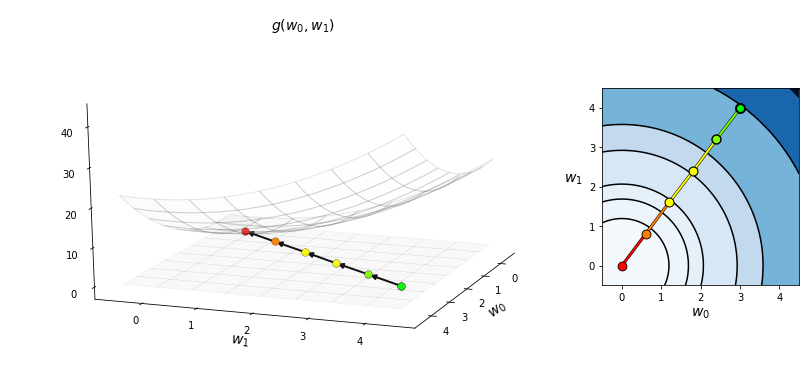

In [269]:
# define function
g = lambda w: np.dot(w.T,w) + 2

# run random search algorithm 
alpha_choice = 1; w = np.array([3,4]); num_samples = 1000; max_its = 5
weight_history_1,cost_history_1 = random_search(g,alpha_choice,max_its,w,num_samples)

two_input_surface_contour_plot(g,weight_history_1,xmin = -0.5,xmax = 4.5,ymin = -0.5,ymax = 4.5,num_contours = 17)

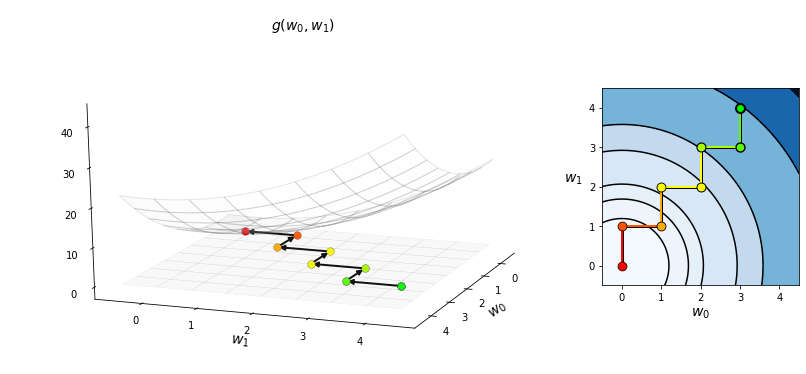

In [270]:
# run coordinate search algorithm 
alpha_choice = 1; w = np.array([3,4]); max_its = 7
weight_history_2,cost_history_2 = coordinate_search(g,alpha_choice,max_its,w)

two_input_surface_contour_plot(g,weight_history_2,xmin = -0.5,xmax = 4.5,ymin = -0.5,ymax = 4.5,num_contours = 17)

# Exercise 2.9. Coordinate search with diminishing steplength

In the next Python cell we compare 5 steps of the random search algorithm (with $P = 1000$ random directions tested at each step) to 5 steps of coordinate search, using the same starting point $\mathbf{w}^0 = \begin{bmatrix}3 \\ 4\end{bmatrix}$ and fixed steplength parameter value $\alpha = 1$ for both.  The test function in this case is a skewed quadratic function

\begin{equation}
g(w_0,w_1) = 0.26\left(w_0^2 + w_1^2\right) - 0.48w_0w_1
\end{equation}

The resulting steps taken by random search are shown on the function contour in the left panel, and likewise for coordinate search in the right panel.  Here while the random search algorithm finds the true minimum at the origin, the coordinate search run halts after the first step due to the steplength being set too large for this particular function / initialization (each of the four coordinate directions are directions of *ascent* at the first step).

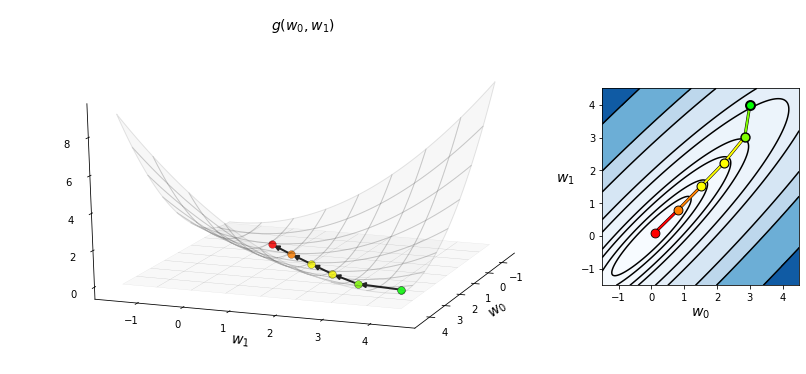

In [277]:
# define function
g = lambda w: 0.26*(w[0]**2 + w[1]**2) - 0.48*w[0]*w[1]

# run random search algorithm 
alpha_choice = 1; w = np.array([3,4]); num_samples = 1000; max_its = 5
weight_history_1,cost_history_1 = random_search(g,alpha_choice,max_its,w,num_samples)

two_input_surface_contour_plot(g,weight_history_1,xmin = -1.5,xmax = 4.5,ymin = -1.5,ymax = 4.5,num_contours = 23)

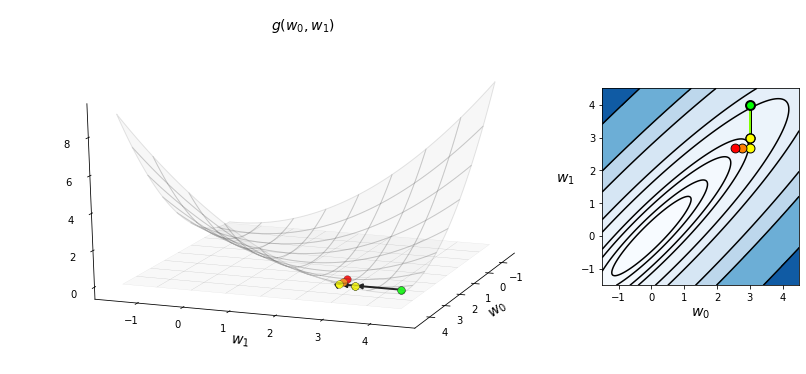

In [281]:
# run coordinate search algorithm 
alpha_choice = 'diminishing'; w = np.array([3,4]); max_its = 5
weight_history_2,cost_history_2 = coordinate_search(g,alpha_choice,max_its,w)

two_input_surface_contour_plot(g,weight_history_2,xmin = -1.5,xmax = 4.5,ymin = -1.5,ymax = 4.5,num_contours = 23)

# Exercise 2.10. Coordinate search versus coordinate descent

In [282]:
# zero order coordinate search
def coordinate_descent_zero_order(g,alpha_choice,max_its,w):  
    # run coordinate search
    N = np.size(w)
    weight_history = []         # container for weight history
    cost_history = []           # container for corresponding cost function history
    alpha = 0
    for k in range(1,max_its+1):        
        # check if diminishing steplength rule used
        if alpha_choice == 'diminishing':
            alpha = 1/float(k)
        else:
            alpha = alpha_choice
        
        # random shuffle of coordinates
        c = np.random.permutation(N)
        
        # forming the direction matrix out of the loop
        cost = g(w)
        
        # loop over each coordinate direction
        for n in range(N):
            direction = np.zeros((N,1)).flatten()
            direction[c[n]] = 1
     
            # record weights and cost evaluation
            weight_history.append(w)
            cost_history.append(cost)

            # evaluate all candidates
            evals =  [g(w + alpha*direction)]
            evals.append(g(w - alpha*direction))
            evals = np.array(evals)

            # if we find a real descent direction take the step in its direction
            ind = np.argmin(evals)
            if evals[ind] < cost_history[-1]:
                # take step
                w = w + ((-1)**(ind))*alpha*direction
                cost = evals[ind]
        
    # record weights and cost evaluation
    weight_history.append(w)
    cost_history.append(g(w))
    return weight_history,cost_history

array([0, 2, 1])

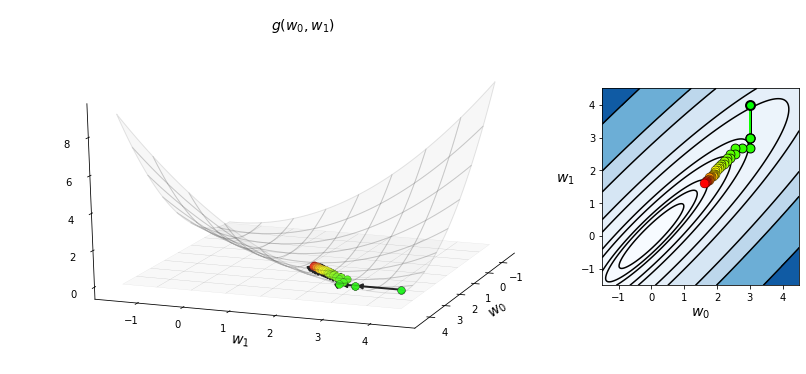

In [283]:
# define function
g = lambda w: 0.26*(w[0]**2 + w[1]**2) - 0.48*w[0]*w[1]

# run coordinate search algorithm 
alpha_choice = 'diminishing'; w = np.array([3,4]); max_its = 40
weight_history_1,cost_history_1 = coordinate_search(g,alpha_choice,max_its,w)

two_input_surface_contour_plot(g,weight_history_1,xmin = -1.5,xmax = 4.5,ymin = -1.5,ymax = 4.5,num_contours = 25)

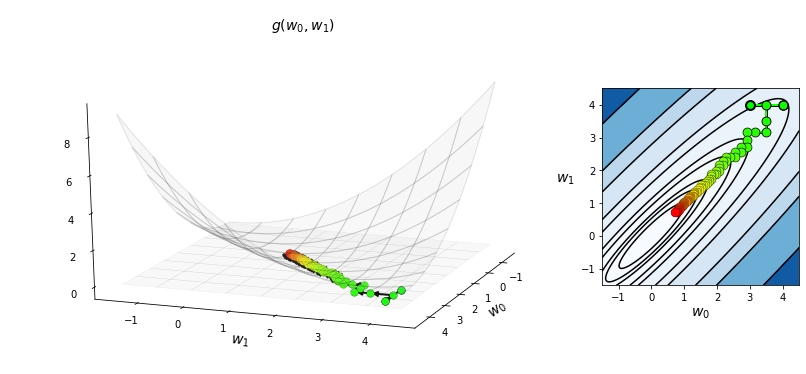

In [294]:
# define function
g = lambda w: 0.26*(w[0]**2 + w[1]**2) - 0.48*w[0]*w[1]

# run coordinate search algorithm 
alpha_choice = 'diminishing'; w = np.array([3,4]); max_its = 40
weight_history_2,cost_history_2 = coordinate_descent_zero_order(g,alpha_choice,max_its,w)

two_input_surface_contour_plot(g,weight_history_2,xmin = -1.5,xmax = 4.5,ymin = -1.5,ymax = 4.5,num_contours = 25)

We can view the precise difference more easily by comparing the two function evaluation histories via the cost function history plot, which we do below.  Here we can see in this instance while the first several steps of coordinate search were more effective than their descent counterparts (since they search over the entire list of coordinate directions instead of one at a time), the coordinate descent method quickly overtakes search finding a lower point on the cost function.

In [288]:
# compare cost histories from multiple runs
def plot_cost_histories(histories,start,**kwargs):
    # plotting colors
    colors = ['k','magenta','aqua','blueviolet','chocolate']
    
    # initialize figure
    fig = plt.figure(figsize = (10,3))

    # create subplot with 1 panel
    gs = gridspec.GridSpec(1, 1) 
    ax = plt.subplot(gs[0]); 
    
    # any labels to add?        
    labels = [' ',' ']
    if 'labels' in kwargs:
        labels = kwargs['labels']
        
    # plot points on cost function plot too?
    points = False
    if 'points' in kwargs:
        points = kwargs['points']

    # run through input histories, plotting each beginning at 'start' iteration
    for c in range(len(histories)):
        history = histories[c]
        label = 0
        if c == 0:
            label = labels[0]
        else:
            label = labels[1]
            
        # check if a label exists, if so add it to the plot
        if np.size(label) == 0:
            ax.plot(np.arange(start,len(history),1),history[start:],linewidth = 3*(0.8)**(c),color = colors[c]) 
        else:               
            ax.plot(np.arange(start,len(history),1),history[start:],linewidth = 3*(0.8)**(c),color = colors[c],label = label) 
            
        # check if points should be plotted for visualization purposes
        if points == True:
            ax.scatter(np.arange(start,len(history),1),history[start:],s = 90,color = colors[c],edgecolor = 'w',linewidth = 2,zorder = 3) 


    # clean up panel
    xlabel = 'step $k$'
    if 'xlabel' in kwargs:
        xlabel = kwargs['xlabel']
    ylabel = r'$g\left(\mathbf{w}^k\right)$'
    if 'ylabel' in kwargs:
        ylabel = kwargs['ylabel']
    ax.set_xlabel(xlabel,fontsize = 14)
    ax.set_ylabel(ylabel,fontsize = 14,rotation = 0,labelpad = 25)
    if np.size(label) > 0:
        anchor = (1,1)
        if 'anchor' in kwargs:
            anchor = kwargs['anchor']
        plt.legend(loc='upper right', bbox_to_anchor=anchor)
        #leg = ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0)

    ax.set_xlim([start - 0.5,len(history) - 0.5])

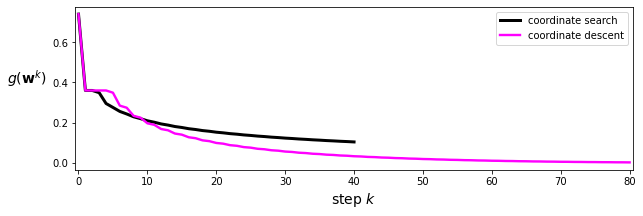

In [289]:
# plot the cost function history for a given run
plot_cost_histories([cost_history_1,cost_history_2],start = 0,points = False,labels = ['coordinate search','coordinate descent'])